In [1]:
import pandas as pd
import os
from utils.ml_utils_v2 import EmissionsPredictionPipeline, XGBMultiOutputPipeline
from utils.eda_utils import EDAUtils, DataCleaningUtils
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import joblib

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
edau = EDAUtils()

In [4]:
SCRIPT_DIR_PATH = os.getcwd()
ROOT_DIR_PATH = os.path.dirname(SCRIPT_DIR_PATH)
DATA_DIR_PATH = os.path.join(ROOT_DIR_PATH, "data")
MAPPING_DIR_PATH = os.path.join(DATA_DIR_PATH, "mapping")
SSP_DIR_PATH = os.path.join(DATA_DIR_PATH, "ssp")
TRAINING_DIR_PATH = os.path.join(DATA_DIR_PATH, "training")
CONFIG_DIR_PATH = os.path.join(SCRIPT_DIR_PATH, "config")

In [5]:
config_dict = edau.read_yaml(os.path.join(CONFIG_DIR_PATH, "ml_training_workflow_config.yaml"))
RUN_ID = config_dict["run_id"]
TRAINING_DATA_PATH = os.path.join(TRAINING_DIR_PATH, f"training_data_sector_{RUN_ID}.parquet")  # sector model
training_df = pd.read_parquet(TRAINING_DATA_PATH)
training_df = training_df.drop(columns=["primary_id", "future_id"])
training_df.head()

,group_1_L_:math:\text{CH}_4 Crop Anaerobic Decomposition Emission Factor,group_5_L_Annual Capture and Sequestration by Type,group_4_L_Crop Yield Factor,group_2_L_Fraction of Food Produced Lost Before Consumption,group_15_L_Clinker Fraction of Cement,group_54_L_Fraction of Waste,group_39_L_Fuel Efficiency,group_12_L_Average Industrial Energy Fuel Efficiency Factor,group_31_L_SCOE Heat Energy Demand Scalar,group_3_L_,...,emission_trns_yr2050,emission_trns_yr2070,emission_trww_yr2030,emission_trww_yr2040,emission_trww_yr2050,emission_trww_yr2070,emission_waso_yr2030,emission_waso_yr2040,emission_waso_yr2050,emission_waso_yr2070
0,0.191205,0.896042,0.224786,0.526063,0.314034,0.576129,0.878773,0.300703,0.465094,0.244025,...,9.362858,6.093222,10.034054,16.026884,21.699030,30.045095,8.259412,10.109980,11.785766,12.669995
1,0.517689,0.650063,0.131869,0.838025,0.558463,0.445818,0.728122,0.133524,0.471282,0.142412,...,9.669779,6.252879,10.110410,16.621763,23.360772,36.322635,8.209029,9.726354,10.771309,9.789541
2,0.693273,0.983010,0.362636,0.712446,0.962973,0.648240,0.762586,0.922478,0.898205,0.229522,...,10.253199,7.215918,10.092362,16.545743,23.246686,36.178485,8.088412,8.935080,8.697389,4.466364
3,0.458554,0.299998,0.112839,0.421732,0.163575,0.716274,0.840648,0.813266,0.917145,0.895763,...,9.576929,6.131174,10.020401,16.004940,21.926815,33.178064,8.209628,9.566777,10.421814,9.505469
4,0.514151,0.762279,0.207972,0.793248,0.483057,0.485020,0.418575,0.569673,0.217555,0.963519,...,13.097978,10.719251,9.995254,15.788989,21.207181,29.585043,8.069024,8.878599,8.912476,5.791930


In [6]:
# print(sorted([col for col in training_df.columns if "_L_" in col]))

## EDA

In [7]:
edau = EDAUtils()

In [8]:
target_col = [
    col
    for col in training_df.columns
    if not col.startswith(("group_")) and col not in ["future_id", "primary_id"]
]
target_col

['emission_total_sum',
 '2033_2037_mean_emission',
 '2066_2070_mean_emission',
 '2025_2035_mean_benefits',
 '2025_2070_mean_benefits',
 '2025_2035_mean_costs',
 '2025_2070_mean_costs',
 '2025_2035_max_costs_rel_to_gdp',
 '2025_2070_max_costs_rel_to_gdp',
 '2025_2035_cumulative_cost_rel_to_gdp',
 '2025_2070_cumulative_cost_rel_to_gdp',
 'emission_agrc_yr2030',
 'emission_agrc_yr2040',
 'emission_agrc_yr2050',
 'emission_agrc_yr2070',
 'emission_frst_yr2030',
 'emission_frst_yr2040',
 'emission_frst_yr2050',
 'emission_frst_yr2070',
 'emission_inen_yr2030',
 'emission_inen_yr2040',
 'emission_inen_yr2050',
 'emission_inen_yr2070',
 'emission_ippu_yr2030',
 'emission_ippu_yr2040',
 'emission_ippu_yr2050',
 'emission_ippu_yr2070',
 'emission_lndu_yr2030',
 'emission_lndu_yr2040',
 'emission_lndu_yr2050',
 'emission_lndu_yr2070',
 'emission_lsmm_yr2030',
 'emission_lsmm_yr2040',
 'emission_lsmm_yr2050',
 'emission_lsmm_yr2070',
 'emission_lvst_yr2030',
 'emission_lvst_yr2040',
 'emission_lv

In [9]:
lhs_group_cols = [col for col in training_df.columns if col.startswith("group_")]
lhs_group_cols

['group_1_L_:math:\\text{CH}_4 Crop Anaerobic Decomposition Emission Factor',
 'group_5_L_Annual Capture and Sequestration by Type',
 'group_4_L_Crop Yield Factor',
 'group_2_L_Fraction of Food Produced Lost Before Consumption',
 'group_15_L_Clinker Fraction of Cement',
 'group_54_L_Fraction of Waste ',
 'group_39_L_Fuel Efficiency ',
 'group_12_L_Average Industrial Energy Fuel Efficiency Factor',
 'group_31_L_SCOE Heat Energy Demand Scalar',
 'group_3_L_',
 'group_23_L_Biogas Recovery Factor at LSMM Anaerobic Facilities',
 'group_25_L_Livestock Manure Management Fraction ',
 'group_40_L_Average Passenger Vehicle Occupancy Rate',
 'group_53_L_Waste Per Capita Scale Factor',
 'group_55_L_Fraction of Landfill Gas Recovered at Landfills',
 'group_56_L_Fraction of Landfill Gas Recovered for Energy',
 'group_8_L_NemoMod ',
 'group_35_L_Liming Demand Scalar',
 'group_50_L_Treatment Fraction ',
 'group_60_X_exports',
 'group_44_L_Transportation Mode Fuel Fraction ',
 'group_10_L_Fraction Non-

In [10]:
training_df[target_col].describe()

,emission_total_sum,2033_2037_mean_emission,2066_2070_mean_emission,2025_2035_mean_benefits,2025_2070_mean_benefits,2025_2035_mean_costs,2025_2070_mean_costs,2025_2035_max_costs_rel_to_gdp,2025_2070_max_costs_rel_to_gdp,2025_2035_cumulative_cost_rel_to_gdp,...,emission_trns_yr2050,emission_trns_yr2070,emission_trww_yr2030,emission_trww_yr2040,emission_trww_yr2050,emission_trww_yr2070,emission_waso_yr2030,emission_waso_yr2040,emission_waso_yr2050,emission_waso_yr2070
count,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,...,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000
mean,6614.627110,140.633123,131.766527,3.085754,20.860816,0.453183,1.064820,0.003612,0.004516,0.002375,...,10.314370,7.627600,9.721269,15.057361,20.129665,27.505935,8.166074,9.382860,10.178365,9.212667
std,546.750170,7.990946,22.961831,0.123867,1.666178,0.022903,0.215790,0.000497,0.000670,0.000209,...,2.407385,2.751969,0.366553,1.106229,1.922254,5.061292,0.084627,0.608515,1.408834,3.167321
min,4879.944208,114.324085,62.406392,2.774586,16.474692,0.386365,0.564739,0.002848,0.003360,0.002002,...,4.179809,1.623831,8.729714,11.736899,13.782425,12.062041,7.918080,7.655525,6.786333,3.386080
25%,6259.099298,135.583507,115.711886,2.987476,19.637186,0.436997,0.892438,0.003256,0.004034,0.002222,...,8.750610,5.715760,9.439374,14.228621,18.805779,24.014145,8.099955,8.937415,9.105994,6.863278
50%,6643.695407,141.613405,131.698188,3.083970,20.776785,0.453193,1.053841,0.003462,0.004360,0.002331,...,10.440560,7.339782,9.926923,15.418427,20.401231,27.638272,8.169362,9.367417,10.043814,8.788693
75%,7003.146542,146.340294,147.924648,3.184884,22.116020,0.469480,1.233063,0.003865,0.004848,0.002494,...,11.950165,9.309496,10.011601,15.926406,21.618576,31.456955,8.232220,9.787821,11.059173,10.996755
max,8291.683846,158.835610,205.918255,3.335583,25.027960,0.516390,1.618471,0.005367,0.007137,0.003095,...,17.860797,19.012072,10.169285,16.998873,24.393380,40.041806,8.363920,11.374733,15.448250,23.746352


In [11]:
print("Shape before dropping zero columns:", training_df.shape)
# Drop columns full of zeros
cols_to_drop = []
for col in training_df.columns:
    if (training_df[col] == 0).all():
        cols_to_drop.append(col)
training_df = training_df.drop(columns=cols_to_drop)
print("Shape after dropping zero columns:", training_df.shape)

Shape before dropping zero columns: (1933, 127)
Shape after dropping zero columns: (1933, 127)


In [12]:
# Check for NaN and infinite values in the training data
for col in training_df.columns:
    nans = training_df[col].isna().sum()
    neg_infs = (training_df[col] == -np.inf).sum()
    pos_infs = (training_df[col] == np.inf).sum()
    if nans > 0 or neg_infs > 0 or pos_infs > 0:
        print(f"WARNING: Column '{col}' has {nans} NaNs, {neg_infs} -inf, {pos_infs} inf values.")

In [13]:
# Recompute target_col after dropping zero columns
target_col = [
    col
    for col in training_df.columns
    if not col.startswith(("group_")) and col not in ["future_id", "primary_id"]
]
target_col

['emission_total_sum',
 '2033_2037_mean_emission',
 '2066_2070_mean_emission',
 '2025_2035_mean_benefits',
 '2025_2070_mean_benefits',
 '2025_2035_mean_costs',
 '2025_2070_mean_costs',
 '2025_2035_max_costs_rel_to_gdp',
 '2025_2070_max_costs_rel_to_gdp',
 '2025_2035_cumulative_cost_rel_to_gdp',
 '2025_2070_cumulative_cost_rel_to_gdp',
 'emission_agrc_yr2030',
 'emission_agrc_yr2040',
 'emission_agrc_yr2050',
 'emission_agrc_yr2070',
 'emission_frst_yr2030',
 'emission_frst_yr2040',
 'emission_frst_yr2050',
 'emission_frst_yr2070',
 'emission_inen_yr2030',
 'emission_inen_yr2040',
 'emission_inen_yr2050',
 'emission_inen_yr2070',
 'emission_ippu_yr2030',
 'emission_ippu_yr2040',
 'emission_ippu_yr2050',
 'emission_ippu_yr2070',
 'emission_lndu_yr2030',
 'emission_lndu_yr2040',
 'emission_lndu_yr2050',
 'emission_lndu_yr2070',
 'emission_lsmm_yr2030',
 'emission_lsmm_yr2040',
 'emission_lsmm_yr2050',
 'emission_lsmm_yr2070',
 'emission_lvst_yr2030',
 'emission_lvst_yr2040',
 'emission_lv

In [14]:
training_df[target_col].describe()

,emission_total_sum,2033_2037_mean_emission,2066_2070_mean_emission,2025_2035_mean_benefits,2025_2070_mean_benefits,2025_2035_mean_costs,2025_2070_mean_costs,2025_2035_max_costs_rel_to_gdp,2025_2070_max_costs_rel_to_gdp,2025_2035_cumulative_cost_rel_to_gdp,...,emission_trns_yr2050,emission_trns_yr2070,emission_trww_yr2030,emission_trww_yr2040,emission_trww_yr2050,emission_trww_yr2070,emission_waso_yr2030,emission_waso_yr2040,emission_waso_yr2050,emission_waso_yr2070
count,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,...,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000,1933.000000
mean,6614.627110,140.633123,131.766527,3.085754,20.860816,0.453183,1.064820,0.003612,0.004516,0.002375,...,10.314370,7.627600,9.721269,15.057361,20.129665,27.505935,8.166074,9.382860,10.178365,9.212667
std,546.750170,7.990946,22.961831,0.123867,1.666178,0.022903,0.215790,0.000497,0.000670,0.000209,...,2.407385,2.751969,0.366553,1.106229,1.922254,5.061292,0.084627,0.608515,1.408834,3.167321
min,4879.944208,114.324085,62.406392,2.774586,16.474692,0.386365,0.564739,0.002848,0.003360,0.002002,...,4.179809,1.623831,8.729714,11.736899,13.782425,12.062041,7.918080,7.655525,6.786333,3.386080
25%,6259.099298,135.583507,115.711886,2.987476,19.637186,0.436997,0.892438,0.003256,0.004034,0.002222,...,8.750610,5.715760,9.439374,14.228621,18.805779,24.014145,8.099955,8.937415,9.105994,6.863278
50%,6643.695407,141.613405,131.698188,3.083970,20.776785,0.453193,1.053841,0.003462,0.004360,0.002331,...,10.440560,7.339782,9.926923,15.418427,20.401231,27.638272,8.169362,9.367417,10.043814,8.788693
75%,7003.146542,146.340294,147.924648,3.184884,22.116020,0.469480,1.233063,0.003865,0.004848,0.002494,...,11.950165,9.309496,10.011601,15.926406,21.618576,31.456955,8.232220,9.787821,11.059173,10.996755
max,8291.683846,158.835610,205.918255,3.335583,25.027960,0.516390,1.618471,0.005367,0.007137,0.003095,...,17.860797,19.012072,10.169285,16.998873,24.393380,40.041806,8.363920,11.374733,15.448250,23.746352


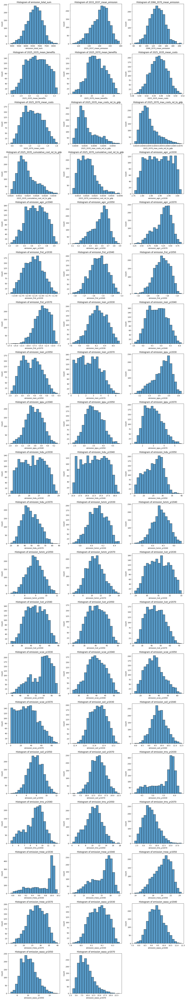

In [15]:
edau.plot_multiple_histograms(training_df, target_col, bins=20, kde=False)
                              

In [16]:

for col in target_col:
    edau.get_target_var_corr(training_df, col, exclude_cols=target_col)


Correlation with target variable 'emission_total_sum' (threshold: 0.1):
--------------------------------------------------
group_34_L_SCOE Fraction Heat Energy Demand  : 0.4181
group_60_X_exports             : 0.4120
group_66_X_elasticity_scoe_enerdem_per : 0.4100
group_64_X_elasticity_ippu_product_use : 0.4093
group_63_X_elasticity_ippu     : 0.4028
group_61_X_cost_enfu_fuel      : 0.4026
group_67_X_elasticity_trde_mtkm_to_gdp_freight : 0.4009
group_68_X_elasticity_trde_pkm_to_gdppc : 0.3961
group_65_X_population_gnrl     : 0.3710
group_62_X_gdp_mmm_usd         : 0.2850
group_27_L_:math:\text{CH}_4 Enteric Fermentation Emission Factor : 0.2677
group_19_L_Unadjusted Land Use Transition Probability : 0.2675
group_31_L_SCOE Heat Energy Demand Scalar : 0.1832
group_29_L_Fraction Eating Red Meat : 0.1826
group_58_L_Fraction of Non-Recycled Solid Waste  : 0.1339


Correlation with target variable '2033_2037_mean_emission' (threshold: 0.1):
--------------------------------------------------

In [17]:
# Outlier inspection
outliers = edau.find_outlier_columns(training_df, method="iqr", factor=1.5)
print("Outlier percentages:", outliers)
outliers = edau.find_outlier_columns(training_df, method="zscore", z_thresh=3.0)
print("Outlier percentages:", outliers)

Outlier percentages: {'emission_total_sum': 0.67, '2033_2037_mean_emission': 0.83, '2066_2070_mean_emission': 0.47, '2025_2035_mean_costs': 0.05, '2025_2035_max_costs_rel_to_gdp': 2.74, '2025_2070_max_costs_rel_to_gdp': 3.47, '2025_2035_cumulative_cost_rel_to_gdp': 1.86, '2025_2070_cumulative_cost_rel_to_gdp': 2.12, 'emission_agrc_yr2050': 0.57, 'emission_agrc_yr2070': 0.62, 'emission_frst_yr2040': 0.1, 'emission_frst_yr2050': 0.31, 'emission_frst_yr2070': 0.62, 'emission_ippu_yr2030': 0.93, 'emission_ippu_yr2040': 0.16, 'emission_ippu_yr2050': 0.05, 'emission_ippu_yr2070': 0.26, 'emission_lndu_yr2050': 0.05, 'emission_lndu_yr2070': 0.05, 'emission_lsmm_yr2040': 0.26, 'emission_lsmm_yr2050': 0.16, 'emission_lsmm_yr2070': 0.16, 'emission_scoe_yr2050': 0.21, 'emission_soil_yr2030': 0.05, 'emission_soil_yr2040': 0.67, 'emission_soil_yr2050': 0.26, 'emission_soil_yr2070': 0.31, 'emission_trns_yr2050': 0.26, 'emission_trns_yr2070': 1.14, 'emission_trww_yr2050': 0.16, 'emission_trww_yr2070':

## Data Cleaning

In [18]:
dcu = DataCleaningUtils()

In [19]:
training_df.shape

(1933, 127)

In [20]:
# # Check those -inf values in technical_cost
# technical_cost_neg_inf = training_df[training_df["technical_cost"] == -np.inf]
# technical_cost_neg_inf

In [21]:
# # filter out -inf values in technical_cost
# training_df = training_df[training_df["technical_cost"] != -np.inf]
# training_df.shape

In [22]:
training_df_cleaned = dcu.remove_outliers(training_df, method="zscore", z_thresh=3.0)
print("Shape before removing outliers:", training_df.shape)
print("Shape after removing outliers:", training_df_cleaned.shape)

Shape before removing outliers: (1933, 127)
Shape after removing outliers: (1840, 127)


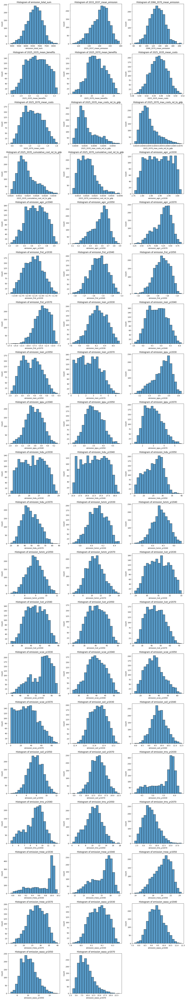

In [23]:
edau.plot_multiple_histograms(training_df, target_col, bins=20, kde=False)

In [24]:
outliers = edau.find_outlier_columns(training_df_cleaned, method="zscore", z_thresh=3.0)
print("Outlier percentages:", outliers)

Outlier percentages: {'2033_2037_mean_emission': 0.16, '2025_2035_max_costs_rel_to_gdp': 0.33, '2025_2070_max_costs_rel_to_gdp': 0.76, '2025_2035_cumulative_cost_rel_to_gdp': 0.22, '2025_2070_cumulative_cost_rel_to_gdp': 0.22, 'emission_agrc_yr2050': 0.11, 'emission_agrc_yr2070': 0.11, 'emission_frst_yr2050': 0.05, 'emission_frst_yr2070': 0.16, 'emission_ippu_yr2030': 0.05, 'emission_ippu_yr2070': 0.05, 'emission_lsmm_yr2040': 0.05, 'emission_soil_yr2040': 0.05, 'emission_soil_yr2050': 0.11, 'emission_soil_yr2070': 0.11, 'emission_trns_yr2070': 0.11, 'emission_waso_yr2070': 0.43}


In [25]:
for col in target_col:
    edau.get_target_var_corr(training_df_cleaned, col, exclude_cols=target_col)


Correlation with target variable 'emission_total_sum' (threshold: 0.1):
--------------------------------------------------
group_34_L_SCOE Fraction Heat Energy Demand  : 0.4270
group_60_X_exports             : 0.4148
group_64_X_elasticity_ippu_product_use : 0.4096
group_66_X_elasticity_scoe_enerdem_per : 0.4077
group_68_X_elasticity_trde_pkm_to_gdppc : 0.3994
group_61_X_cost_enfu_fuel      : 0.3994
group_67_X_elasticity_trde_mtkm_to_gdp_freight : 0.3982
group_63_X_elasticity_ippu     : 0.3977
group_65_X_population_gnrl     : 0.3795
group_62_X_gdp_mmm_usd         : 0.3037
group_27_L_:math:\text{CH}_4 Enteric Fermentation Emission Factor : 0.2683
group_19_L_Unadjusted Land Use Transition Probability : 0.2545
group_31_L_SCOE Heat Energy Demand Scalar : 0.1898
group_29_L_Fraction Eating Red Meat : 0.1793
group_58_L_Fraction of Non-Recycled Solid Waste  : 0.1313


Correlation with target variable '2033_2037_mean_emission' (threshold: 0.1):
--------------------------------------------------

In [26]:
# edau.plot_multiple_histograms(training_df_cleaned, training_df_cleaned.drop(columns=["emission_total"]).columns.tolist(), bins=30, kde=False)

In [27]:
# training_df_cleaned[target_cols].describe()

In [28]:
# sns.pairplot(training_df_cleaned[[c for c in training_df_cleaned.columns if c.startswith("group_38") or c.startswith("group_39")] + ["total_negative_emissions"]])

In [29]:
# edau.plot_correlation_matrix(training_df_cleaned[[c for c in training_df_cleaned.columns if c.startswith("group_38") or c.startswith("group_39")] + ["total_negative_emissions"]])

## ML


=== XGB (TEST results) ===
emission_total_sum             → MAE: 151.0083 | RMSE: 194.0757 | R²: 0.8567 | SMAPE: 2.3%
2033_2037_mean_emission        → MAE: 1.6836 | RMSE: 2.1468 | R²: 0.9214 | SMAPE: 1.2%
2066_2070_mean_emission        → MAE: 6.6740 | RMSE: 8.5167 | R²: 0.8424 | SMAPE: 5.2%
2025_2035_mean_benefits        → MAE: 0.0061 | RMSE: 0.0105 | R²: 0.9917 | SMAPE: 0.2%
2025_2070_mean_benefits        → MAE: 0.0858 | RMSE: 0.1432 | R²: 0.9912 | SMAPE: 0.4%
2025_2035_mean_costs           → MAE: 0.0031 | RMSE: 0.0040 | R²: 0.9679 | SMAPE: 0.7%
2025_2070_mean_costs           → MAE: 0.0219 | RMSE: 0.0288 | R²: 0.9793 | SMAPE: 2.1%
2025_2035_max_costs_rel_to_gdp → MAE: 0.0001 | RMSE: 0.0001 | R²: 0.9493 | SMAPE: 2.2%
2025_2070_max_costs_rel_to_gdp → MAE: 0.0001 | RMSE: 0.0001 | R²: 0.9592 | SMAPE: 2.0%
2025_2035_cumulative_cost_rel_to_gdp → MAE: 0.0001 | RMSE: 0.0001 | R²: 0.8280 | SMAPE: 2.6%
2025_2070_cumulative_cost_rel_to_gdp → MAE: 0.0001 | RMSE: 0.0001 | R²: 0.9347 | SMAPE: 4.2%

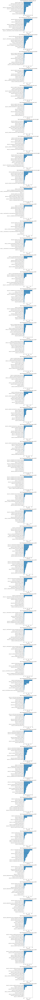

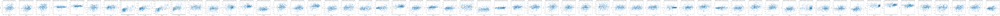

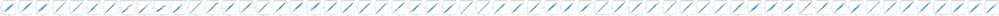

In [30]:
mulp = XGBMultiOutputPipeline(df=training_df_cleaned, targets=target_col)
mulp.run(tune=False, log_transform=False, plot_figures=True)

## Save the trained and tuned model and use it to predict new data

In [31]:
training_df_cleaned.head()

,group_1_L_:math:\text{CH}_4 Crop Anaerobic Decomposition Emission Factor,group_5_L_Annual Capture and Sequestration by Type,group_4_L_Crop Yield Factor,group_2_L_Fraction of Food Produced Lost Before Consumption,group_15_L_Clinker Fraction of Cement,group_54_L_Fraction of Waste,group_39_L_Fuel Efficiency,group_12_L_Average Industrial Energy Fuel Efficiency Factor,group_31_L_SCOE Heat Energy Demand Scalar,group_3_L_,...,emission_trns_yr2050,emission_trns_yr2070,emission_trww_yr2030,emission_trww_yr2040,emission_trww_yr2050,emission_trww_yr2070,emission_waso_yr2030,emission_waso_yr2040,emission_waso_yr2050,emission_waso_yr2070
0,0.191205,0.896042,0.224786,0.526063,0.314034,0.576129,0.878773,0.300703,0.465094,0.244025,...,9.362858,6.093222,10.034054,16.026884,21.699030,30.045095,8.259412,10.109980,11.785766,12.669995
1,0.517689,0.650063,0.131869,0.838025,0.558463,0.445818,0.728122,0.133524,0.471282,0.142412,...,9.669779,6.252879,10.110410,16.621763,23.360772,36.322635,8.209029,9.726354,10.771309,9.789541
2,0.693273,0.983010,0.362636,0.712446,0.962973,0.648240,0.762586,0.922478,0.898205,0.229522,...,10.253199,7.215918,10.092362,16.545743,23.246686,36.178485,8.088412,8.935080,8.697389,4.466364
3,0.458554,0.299998,0.112839,0.421732,0.163575,0.716274,0.840648,0.813266,0.917145,0.895763,...,9.576929,6.131174,10.020401,16.004940,21.926815,33.178064,8.209628,9.566777,10.421814,9.505469
4,0.514151,0.762279,0.207972,0.793248,0.483057,0.485020,0.418575,0.569673,0.217555,0.963519,...,13.097978,10.719251,9.995254,15.788989,21.207181,29.585043,8.069024,8.878599,8.912476,5.791930


In [32]:
# Get a single row from training_df_cleaned for prediction
single_row = training_df_cleaned.iloc[0].drop(columns="emission_total")
single_row = single_row.to_frame().T  # Convert to DataFrame
single_row

,group_1_L_:math:\text{CH}_4 Crop Anaerobic Decomposition Emission Factor,group_5_L_Annual Capture and Sequestration by Type,group_4_L_Crop Yield Factor,group_2_L_Fraction of Food Produced Lost Before Consumption,group_15_L_Clinker Fraction of Cement,group_54_L_Fraction of Waste,group_39_L_Fuel Efficiency,group_12_L_Average Industrial Energy Fuel Efficiency Factor,group_31_L_SCOE Heat Energy Demand Scalar,group_3_L_,...,emission_trns_yr2050,emission_trns_yr2070,emission_trww_yr2030,emission_trww_yr2040,emission_trww_yr2050,emission_trww_yr2070,emission_waso_yr2030,emission_waso_yr2040,emission_waso_yr2050,emission_waso_yr2070
0,0.191205,0.896042,0.224786,0.526063,0.314034,0.576129,0.878773,0.300703,0.465094,0.244025,...,9.362858,6.093222,10.034054,16.026884,21.69903,30.045095,8.259412,10.10998,11.785766,12.669995


In [33]:
# Predict using the trained model
predictions = mulp.predict(single_row)
print("Predictions for single row:")
predictions

Predictions for single row:


,emission_total_sum,2033_2037_mean_emission,2066_2070_mean_emission,2025_2035_mean_benefits,2025_2070_mean_benefits,2025_2035_mean_costs,2025_2070_mean_costs,2025_2035_max_costs_rel_to_gdp,2025_2070_max_costs_rel_to_gdp,2025_2035_cumulative_cost_rel_to_gdp,...,emission_trns_yr2050,emission_trns_yr2070,emission_trww_yr2030,emission_trww_yr2040,emission_trww_yr2050,emission_trww_yr2070,emission_waso_yr2030,emission_waso_yr2040,emission_waso_yr2050,emission_waso_yr2070
0,7432.617188,155.916672,162.285629,2.933771,19.266863,0.448816,0.833746,0.003274,0.003868,0.002277,...,9.365993,6.097842,10.033547,16.027336,21.701517,30.046509,8.258778,10.10856,11.785805,12.668786


In [34]:
print("Original values:")
print(training_df_cleaned.iloc[0][target_col])

Original values:
emission_total_sum                      7431.303667
2033_2037_mean_emission                  155.943011
2066_2070_mean_emission                  162.178247
2025_2035_mean_benefits                    2.934405
2025_2070_mean_benefits                   19.269972
2025_2035_mean_costs                       0.448135
2025_2070_mean_costs                       0.834822
2025_2035_max_costs_rel_to_gdp             0.003210
2025_2070_max_costs_rel_to_gdp             0.003797
2025_2035_cumulative_cost_rel_to_gdp       0.002197
2025_2070_cumulative_cost_rel_to_gdp       0.001412
emission_agrc_yr2030                       2.830626
emission_agrc_yr2040                       3.607809
emission_agrc_yr2050                       3.688483
emission_agrc_yr2070                       4.654317
emission_frst_yr2030                     -12.372917
emission_frst_yr2040                     -14.798950
emission_frst_yr2050                     -14.975426
emission_frst_yr2070                     -10.07

In [35]:
# Save the trained model
xgb_pipeline = mulp.pipeline  # only one now
TRAINED_MODELS_DIR = os.path.join(SCRIPT_DIR_PATH, "trained_models")
model_file_name = f"xgb_pipeline_sector_independent_{RUN_ID}.pkl"  # Variante A: MultiOutputRegressor
os.makedirs(TRAINED_MODELS_DIR, exist_ok=True)
overwrite_existing_model = True  # Set to True to overwrite existing model

MODEL_PATH = os.path.join(TRAINED_MODELS_DIR, model_file_name)
if os.path.exists(MODEL_PATH) and not overwrite_existing_model:
    print(f"Model {model_file_name} already exists at {MODEL_PATH}. Skipping save.")
else:
    print(f"Saving model to {MODEL_PATH} ...")
    joblib.dump(xgb_pipeline, MODEL_PATH)
    print("✅ Model saved successfully.")

Saving model to /Users/alexa/Projects/ssp_uganda_data/metamodel/surrogate_model_sector/trained_models/xgb_pipeline_sector_independent_2025-11-12t22;19;28.194097.pkl ...
✅ Model saved successfully.


## Variante B: XGBoost Native Multi-Output Tree

Train a single model with `multi_strategy='multi_output_tree'` (XGBoost 2.0+). Shares tree structure across all targets — captures temporal and sector correlations, faster and more compact.

In [36]:
import xgboost as xgb
print('XGBoost version:', xgb.__version__)

# Rebuild train/test split (same as Variante A)
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
import numpy as np

feature_cols = [c for c in training_df_cleaned.columns if c.startswith('group_')]
X = training_df_cleaned[feature_cols].values
y = training_df_cleaned[target_col].values
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(X, y, test_size=0.2, random_state=42)
print(f'Train: {X_train_b.shape}, Test: {X_test_b.shape}, Targets: {y_train_b.shape[1]}')


XGBoost version: 3.2.0
Train: (1472, 68), Test: (368, 68), Targets: 59


In [37]:
multitree_model = xgb.XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    tree_method='hist',
    multi_strategy='multi_output_tree',
    random_state=42,
    verbosity=0,
)
multitree_model.fit(X_train_b, y_train_b)
print('Variante B training complete')


Variante B training complete


In [38]:
# Save Variante B
import joblib
model_b_path = os.path.join(TRAINED_MODELS_DIR, f'xgb_pipeline_sector_multitree_{RUN_ID}.pkl')
joblib.dump(multitree_model, model_b_path)
print(f'Saved Variante B: {model_b_path}')


Saved Variante B: /Users/alexa/Projects/ssp_uganda_data/metamodel/surrogate_model_sector/trained_models/xgb_pipeline_sector_multitree_2025-11-12t22;19;28.194097.pkl


## Comparación Variante A vs Variante B

R² y MAE por sector × año en el test set.

In [41]:
# Variante A predictions from mulp
y_pred_a = mulp.pipeline.predict(training_df_cleaned[feature_cols].values[len(X_train_b):])
# Note: mulp uses its own internal train/test split — use X_test from Variante B for fair comparison
y_pred_a = mulp.pipeline.predict(X_test_b)
y_pred_b = multitree_model.predict(X_test_b)

print(f'{"Target":<40} {"R2_A":>8} {"R2_B":>8} {"MAE_A":>10} {"MAE_B":>10} {"Winner":>8}')
print('-' * 90)

r2_a_list, r2_b_list = [], []
for j, tgt in enumerate(target_col):
    r2_a = r2_score(y_test_b[:, j], y_pred_a[:, j])
    r2_b = r2_score(y_test_b[:, j], y_pred_b[:, j])
    mae_a = mean_absolute_error(y_test_b[:, j], y_pred_a[:, j])
    mae_b = mean_absolute_error(y_test_b[:, j], y_pred_b[:, j])
    winner = 'A' if r2_a >= r2_b else 'B'
    flag = ' ⚠' if min(r2_a, r2_b) < 0.80 else ''
    print(f'{tgt:<40} {r2_a:>8.3f} {r2_b:>8.3f} {mae_a:>10.3f} {mae_b:>10.3f} {winner:>8}{flag}')
    r2_a_list.append(r2_a)
    r2_b_list.append(r2_b)

print('-' * 90)
print(f'{"MEAN":<40} {np.mean(r2_a_list):>8.3f} {np.mean(r2_b_list):>8.3f}')
print(f'\nRecommendation: {"Variante B (multitree)" if np.mean(r2_b_list) > np.mean(r2_a_list) else "Variante A (independent)"}')

Target                                       R2_A     R2_B      MAE_A      MAE_B   Winner
------------------------------------------------------------------------------------------
emission_total_sum                          0.857    0.917    151.008    116.813        B
2033_2037_mean_emission                     0.921    0.872      1.684      2.197        A
2066_2070_mean_emission                     0.842    0.902      6.674      5.496        B
2025_2035_mean_benefits                     0.992    0.457      0.006      0.073        A ⚠
2025_2070_mean_benefits                     0.991    0.522      0.086      0.906        A ⚠
2025_2035_mean_costs                        0.968    0.385      0.003      0.014        A ⚠
2025_2070_mean_costs                        0.979    0.434      0.022      0.128        A ⚠
2025_2035_max_costs_rel_to_gdp              0.949    0.836      0.000      0.000        A
2025_2070_max_costs_rel_to_gdp              0.959    0.805      0.000      0.000        A
2

## Example of loading the trained model to predict

In [42]:
# Load the trained model and test predictions
xgb_pipeline_loaded = joblib.load(MODEL_PATH)

In [43]:
# Predict using the trained model
predictions = mulp.predict(single_row)
print("Predictions for single row:")
predictions

Predictions for single row:


,emission_total_sum,2033_2037_mean_emission,2066_2070_mean_emission,2025_2035_mean_benefits,2025_2070_mean_benefits,2025_2035_mean_costs,2025_2070_mean_costs,2025_2035_max_costs_rel_to_gdp,2025_2070_max_costs_rel_to_gdp,2025_2035_cumulative_cost_rel_to_gdp,...,emission_trns_yr2050,emission_trns_yr2070,emission_trww_yr2030,emission_trww_yr2040,emission_trww_yr2050,emission_trww_yr2070,emission_waso_yr2030,emission_waso_yr2040,emission_waso_yr2050,emission_waso_yr2070
0,7432.617188,155.916672,162.285629,2.933771,19.266863,0.448816,0.833746,0.003274,0.003868,0.002277,...,9.365993,6.097842,10.033547,16.027336,21.701517,30.046509,8.258778,10.10856,11.785805,12.668786


In [44]:
print("Original values:")
training_df_cleaned.iloc[0][target_col]

Original values:


emission_total_sum                      7431.303667
2033_2037_mean_emission                  155.943011
2066_2070_mean_emission                  162.178247
2025_2035_mean_benefits                    2.934405
2025_2070_mean_benefits                   19.269972
2025_2035_mean_costs                       0.448135
2025_2070_mean_costs                       0.834822
2025_2035_max_costs_rel_to_gdp             0.003210
2025_2070_max_costs_rel_to_gdp             0.003797
2025_2035_cumulative_cost_rel_to_gdp       0.002197
2025_2070_cumulative_cost_rel_to_gdp       0.001412
emission_agrc_yr2030                       2.830626
emission_agrc_yr2040                       3.607809
emission_agrc_yr2050                       3.688483
emission_agrc_yr2070                       4.654317
emission_frst_yr2030                     -12.372917
emission_frst_yr2040                     -14.798950
emission_frst_yr2050                     -14.975426
emission_frst_yr2070                     -10.077166
emission_ine